In [1]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import find_peaks
import pandas as pd
import seaborn as sns
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scipy.stats import norm
from scipy import signal
from matplotlib import gridspec
import matplotlib 
from open_ephys.analysis import Session
import sqlite3
import scipy
from pathlib import Path
import glob
import os
from os import listdir
import pywt

sns.set(style="ticks", rc={"lines.linewidth": 5})
matplotlib.rc('xtick', labelsize=50) 
matplotlib.rc('ytick', labelsize=50) 
matplotlib.rc('axes', labelsize=50)  
matplotlib.rc('axes', titlesize=50)  
matplotlib.rc('figure', titlesize=100)
matplotlib.rc('legend', fontsize=50) 
matplotlib.rc('legend', title_fontsize=50)

ModuleNotFoundError: No module named 'open_ephys'

In [ ]:
imshow(EEGa,                                   # Image the data from condition A.
           cmap='BuPu',                            # ... set the colormap (optional)
           extent=[t[0], t[-1], 1, ntrials],       # ... set axis limits (t[-1] represents the last element of t)
           aspect='auto',                          # ... set aspect ratio 
           origin='lower')                         # ... put origin in lower left corner

In [ ]:
data = loadmat('matfiles/EEG-1.mat')  # Load the EEG data
EEG = data['EEG'].reshape(-1)         # Extract the EEG variable
t = data['t'][0]                      # ... and the t variable

x = EEG                               # Relabel the data variable
dt = t[1] - t[0]                      # Define the sampling interval
N = x.shape[0]                        # Define the total number of data points
T = N * dt                            # Define the total duration of the data

xf = fft(x - x.mean())                # Compute Fourier transform of x
Sxx = 2 * dt ** 2 / T * (xf * xf.conj())  # Compute spectrum
Sxx = Sxx[:int(len(x) / 2)]           # Ignore negative frequencies

df = 1 / T.max()                      # Determine frequency resolution
fNQ = 1 / dt / 2                      # Determine Nyquist frequency
faxis = arange(0,fNQ,df)              # Construct frequency axis

plot(faxis, Sxx.real)                 # Plot spectrum vs frequency
xlim([0, 100])                        # Select frequency range
xlabel('Frequency [Hz]')              # Label the axes
ylabel('Power [$\mu V^2$/Hz]')
show()

In [ ]:
Fs = 1 / dt               # Define the sampling frequency,
interval = int(Fs)        # ... the interval size,
overlap = int(Fs * 0.95)  # ... and the overlap intervals

                          # Compute the spectrogram
f, t, Sxx = spectrogram(
    EEG,                  # Provide the signal,
    fs=Fs,                # ... the sampling frequency,
    nperseg=interval,     # ... the length of a segment,
    noverlap=overlap)     # ... the number of samples to overlap,
pcolormesh(t, f, 10 * log10(Sxx),
               cmap='jet')# Plot the result
colorbar()                # ... with a color bar,
ylim([0, 70])             # ... set the frequency range,
xlabel('Time [s]')        # ... and label the axes
ylabel('Frequency [Hz]')
savefig('imgs/3-14')
show()

In [ ]:
variables = ['Goal','CurrentState','ChosenState','Distance','ChosenLocation','Choice','IsGoal']
epochs = ['ForePeriodEntry','DelayperiodEntry','DelayperiodExit','FeedbackPeriodEntry','ITIEntry']

state_dict = dict(zip(np.arange(1,14),['A1','A2','A3','A4','A5','B1','B2','B3','B4','B5','C2','C3','C4']))
distance_dict = dict(zip(np.arange(1,9),np.arange(1,9)))
loc_dict = dict(zip(np.arange(200,800,200),['left','top','right']))
choice_dict = dict(zip([0,1],['Incorrect','Correct']))
goal_dict = dict(zip([0,1],['Non-Goal','Goal']))

variable_dict = pd.DataFrame(data={'col1': variables, 
                           'col2': pd.Series([state_dict,state_dict,state_dict,distance_dict,loc_dict,choice_dict,goal_dict])})

In [6]:
listdir(Path('D:/HexinData'))

['Dylan_2024-03-18_13-29-27_HPC',
 'Dylan_2024-03-19_14-42-22_HPC',
 'Dylan_2024-03-20_13-55-20_HPC',
 'Dylan_2024-03-21_14-55-03_HPC',
 'Dylan_2024-03-25_13-58-44_HPC',
 'Dylan_2024-03-26_14-09-51_HPC',
 'Dylan_2024-03-27_12-21-08_HPC',
 'Dylan_2024-03-28_14-32-11_HPC']

In [ ]:
mypath = Path('D:/HexinData')
for ii,f in enumerate(listdir(mypath)):
    if ii==7:
        DATA_DIRECTORY = mypath / f
        print(DATA_DIRECTORY)
        clusters,spikes_ts,beh = load_data(DATA_DIRECTORY)
        plot_session_neuron(DATA_DIRECTORY,clusters,spikes_ts,beh)

In [5]:
beh,recording,timestamps = load_data(Path('D:\HexinData\Dylan_2024-03-20_13-55-20_HPC'))

In [68]:
ind = np.where((timestamps-timestamps[0])>54)[0][0]
artifact = recording.continuous[0].get_samples(start_sample_index=ind-30000*2, end_sample_index=ind+30000*2)

In [69]:
ind = np.where((timestamps-timestamps[0])>60+51)[0][0]
spike_waveform = recording.continuous[0].get_samples(start_sample_index=ind-30000*2, end_sample_index=ind+30000*2)

In [74]:
sns.set(style="ticks", rc={"lines.linewidth": 1})
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10) 
matplotlib.rc('axes', labelsize=10)  
matplotlib.rc('axes', titlesize=10)  
matplotlib.rc('figure', titlesize=20)
matplotlib.rc('legend', fontsize=10) 
matplotlib.rc('legend', title_fontsize=10)

Text(0, 0.5, 'voltage (uV)')

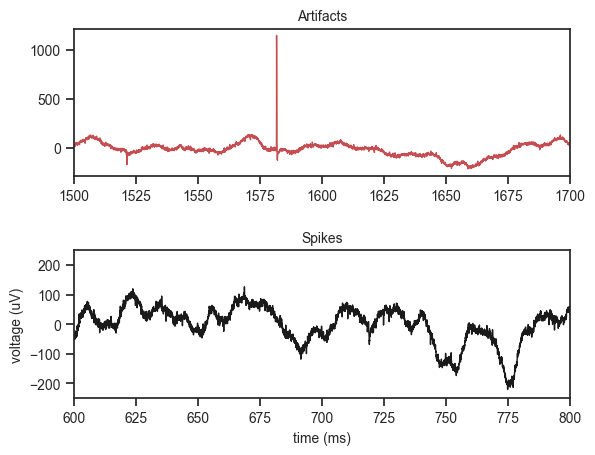

In [83]:
plt.close('all')
gs = gridspec.GridSpec(2, 1,wspace=0.2,hspace=0.5) 

ax = plt.subplot(gs[0])
ax.plot(np.arange(120000)/30,artifact[:,0],'r-',lw=1)
ax.set_xlim(1500,1700)
ax.set_title('Artifacts')

ax = plt.subplot(gs[1])
ax.plot(np.arange(120000)/30,spike_waveform[:,38],'k-',lw=1)
ax.set_xlim(600,800)
ax.set_ylim(-250,250)
ax.set_title('Spikes')

plt.xlabel('time (ms)')
plt.ylabel('voltage (uV)')

Text(0, 0.5, 'voltage (uV)')

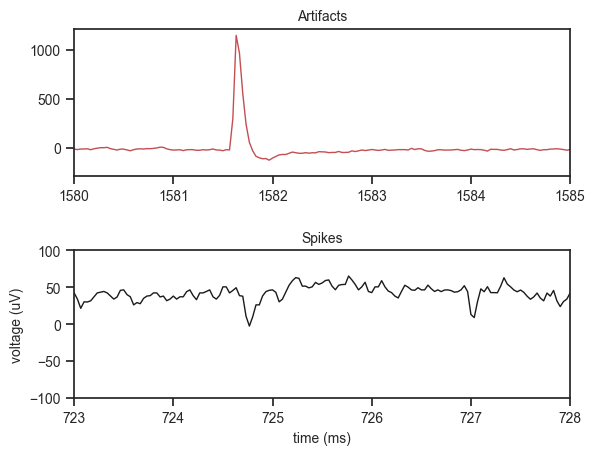

In [88]:
plt.close('all')
gs = gridspec.GridSpec(2, 1,wspace=0.2,hspace=0.5) 

ax = plt.subplot(gs[0])
ax.plot(np.arange(120000)/30,artifact[:,0],'r-',lw=1)
ax.set_xlim(1580,1585)
ax.set_title('Artifacts')

ax = plt.subplot(gs[1])
ax.plot(np.arange(120000)/30,spike_waveform[:,38],'k-',lw=1)
ax.set_xlim(723,728)
ax.set_ylim(-100,100)
ax.set_title('Spikes')

plt.xlabel('time (ms)')
plt.ylabel('voltage (uV)')

(-400.0, 600.0)

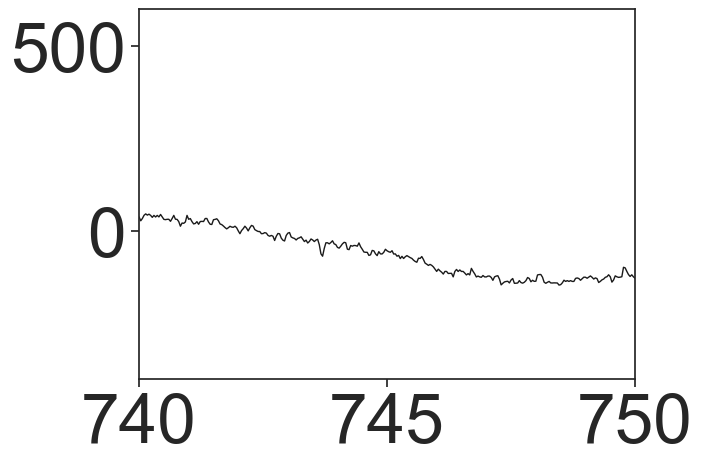

In [65]:
plt.close('all')
plt.plot(np.arange(120000)/30,a[:,38],'k-',lw=1)
# filtered = signal.sosfilt(sos, a[:,38])
# plt.plot(np.arange(120000)/30,filtered+200,'k-',lw=1)
plt.xlim([740,750])
plt.ylim(-400,600)

In [54]:
sos = signal.butter(1, 600, btype='highpass',output='sos',fs=30000)

(3580.0, 3590.0)

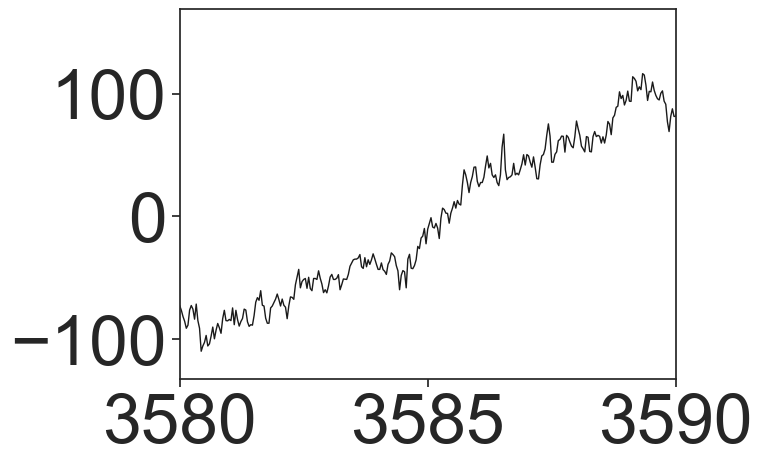

In [66]:
plt.close('all')
plt.plot(np.arange(105000,110000)/30,a[105000:110000,0],'k-',lw=1)
plt.xlim(3580,3590)

(3520.0, 3522.5)

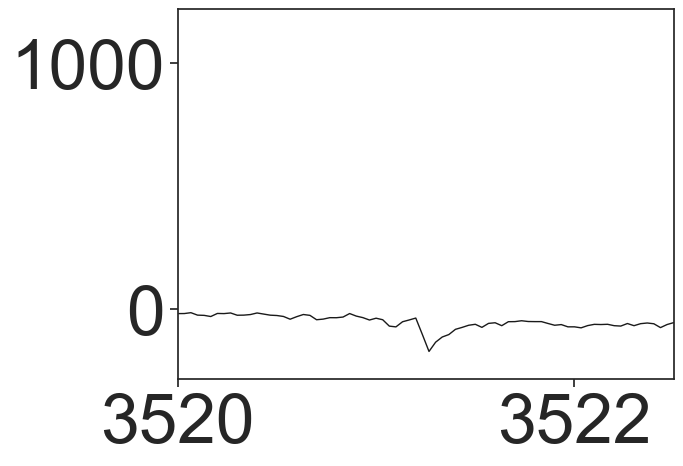

In [26]:
plt.close('all')
plt.plot(np.arange(105000,110000)/30,a[105000:110000,0],'k-',lw=1)
plt.xlim(3520,3522.5)

In [20]:
fs = 3000
frequencies = np.arange(1,200) / fs # normalize
scales = pywt.frequency2scale('cmor1.5-1.0', frequencies)

In [33]:
scales

array([3000.        , 1500.        , 1000.        ,  750.        ,
        600.        ,  500.        ,  428.57142857,  375.        ,
        333.33333333,  300.        ,  272.72727273,  250.        ,
        230.76923077,  214.28571429,  200.        ,  187.5       ,
        176.47058824,  166.66666667,  157.89473684,  150.        ,
        142.85714286,  136.36363636,  130.43478261,  125.        ,
        120.        ,  115.38461538,  111.11111111,  107.14285714,
        103.44827586,  100.        ,   96.77419355,   93.75      ,
         90.90909091,   88.23529412,   85.71428571,   83.33333333,
         81.08108108,   78.94736842,   76.92307692,   75.        ,
         73.17073171,   71.42857143,   69.76744186,   68.18181818,
         66.66666667,   65.2173913 ,   63.82978723,   62.5       ,
         61.2244898 ,   60.        ,   58.82352941,   57.69230769,
         56.60377358,   55.55555556,   54.54545455,   53.57142857,
         52.63157895,   51.72413793,   50.84745763,   50.     

In [32]:
frequencies

array([8.33333333e-05, 1.66666667e-04, 2.50000000e-04, 3.33333333e-04,
       4.16666667e-04, 5.00000000e-04, 5.83333333e-04, 6.66666667e-04,
       7.50000000e-04, 8.33333333e-04, 9.16666667e-04, 1.00000000e-03,
       1.08333333e-03, 1.16666667e-03, 1.25000000e-03, 1.33333333e-03,
       1.41666667e-03, 1.50000000e-03, 1.58333333e-03, 1.66666667e-03,
       1.75000000e-03, 1.83333333e-03, 1.91666667e-03, 2.00000000e-03,
       2.08333333e-03, 2.16666667e-03, 2.25000000e-03, 2.33333333e-03,
       2.41666667e-03, 2.50000000e-03, 2.58333333e-03, 2.66666667e-03,
       2.75000000e-03, 2.83333333e-03, 2.91666667e-03, 3.00000000e-03,
       3.08333333e-03, 3.16666667e-03, 3.25000000e-03, 3.33333333e-03,
       3.41666667e-03, 3.50000000e-03, 3.58333333e-03, 3.66666667e-03,
       3.75000000e-03, 3.83333333e-03, 3.91666667e-03, 4.00000000e-03,
       4.08333333e-03, 4.16666667e-03, 4.25000000e-03, 4.33333333e-03,
       4.41666667e-03, 4.50000000e-03, 4.58333333e-03, 4.66666667e-03,
      

In [21]:
ind = np.where((timestamps-timestamps[0])>54)[0][0]
sig = recording.continuous[0].get_samples(start_sample_index=ind-30000*2, end_sample_index=ind+30000*2)

In [22]:
downsampled = sig[:,0][::10]

In [18]:
downsampled.shape

(12000,)

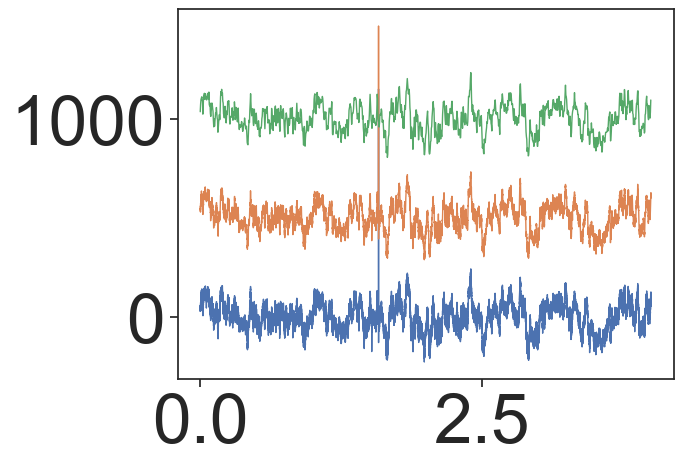

In [19]:
plt.close('all')
plt.plot(np.arange(120000)/30000,sig[:,0],lw=1)
plt.plot(np.arange(120000)[::10]/30000,sig[:,0][::10]+500,lw=1)
plt.plot(np.arange(120000)[::100]/30000,sig[:,0][::100]+1000,lw=1)
# plt.xlim(2,4)

In [19]:
from numpy.fft import fft, rfft
from scipy.signal import spectrogram

In [ ]:
sp = np.fft.fft(np.sin(t))
freq = np.fft.fftfreq(t.shape[-1])
plt.plot(freq, sp.real, freq, sp.imag)

In [ ]:
data = loadmat('matfiles/EEG-1.mat')  # Load the EEG data
EEG = data['EEG'].reshape(-1)         # Extract the EEG variable
t = data['t'][0]                      # ... and the t variable

x = EEG                               # Relabel the data variable
dt = t[1] - t[0]                      # Define the sampling interval
N = x.shape[0]                        # Define the total number of data points
T = N * dt                            # Define the total duration of the data

xf = fft(x - x.mean())                # Compute Fourier transform of x
Sxx = 2 * dt ** 2 / T * (xf * xf.conj())  # Compute spectrum
Sxx = Sxx[:int(len(x) / 2)]           # Ignore negative frequencies

df = 1 / T.max()                      # Determine frequency resolution
fNQ = 1 / dt / 2                      # Determine Nyquist frequency
faxis = arange(0,fNQ,df)              # Construct frequency axis

plot(faxis, Sxx.real)                 # Plot spectrum vs frequency
xlim([0, 100])                        # Select frequency range
xlabel('Frequency [Hz]')              # Label the axes
ylabel('Power [$\mu V^2$/Hz]')
show()

In [26]:
x = downsampled.copy()
xf = fft(x - x.mean())                  # Compute Fourier transform of x
dt=1/3000
T = 4
Sxx = 2 * dt ** 2 / T * (xf * np.conj(xf)) # Compute spectrum
Sxx = Sxx[:int(len(x) / 2)]             # Ignore negative frequencies

df = 3000                        # Determine frequency resolution
fNQ = 1 / dt / 2                        # Determine Nyquist frequency
faxis = arange(0,fNQ,df)                # Construct frequency axis

plot(faxis, real(Sxx))                  # Plot spectrum vs frequency
xlim([0, 100])                          # Select frequency range
xlabel('Frequency [Hz]')                # Label the axes
ylabel('Power [$\mu V^2$/Hz]')
show()

AttributeError: 'int' object has no attribute 'max'

In [29]:
[coefficients, frequencies] = pywt.cwt(downsampled, scales, 'mexh')

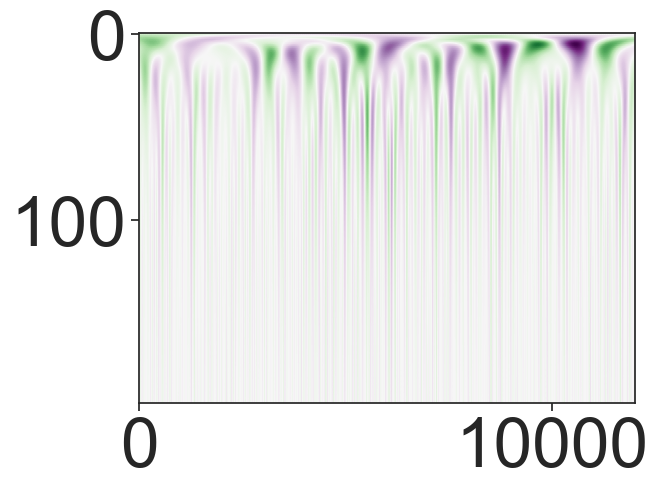

In [31]:
plt.imshow(coefficients, cmap='PRGn', aspect='auto',
           vmax=abs(coefficients).max(), vmin=-abs(coefficients).max())  
plt.show() 

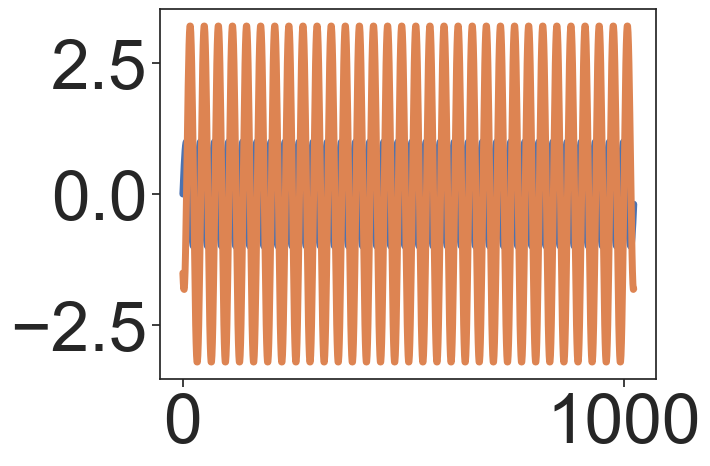

In [17]:
plt.close('all')
plt.plot(x,y)
plt.plot(coef[5,:])

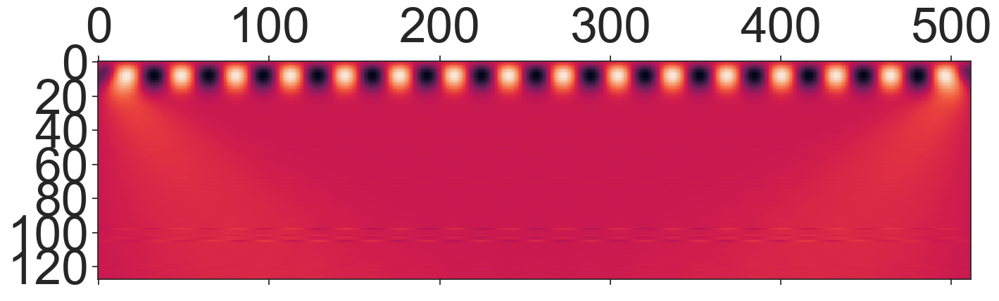

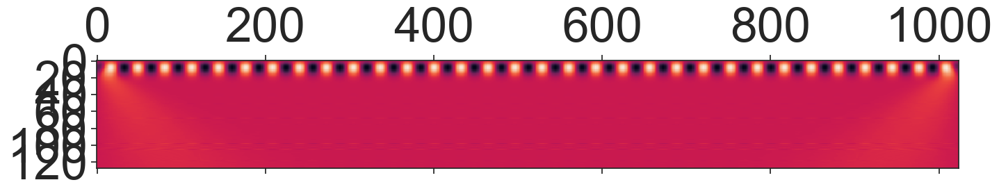

In [7]:
x = np.arange(512)
y = np.sin(2*np.pi*x/32)
coef, freqs=pywt.cwt(y,np.arange(1,129),'gaus1')
plt.matshow(coef) 

x = np.arange(1024)
y = np.sin(2*np.pi*x/32)
coef, freqs=pywt.cwt(y,np.arange(1,129),'gaus1')
plt.matshow(coef)
plt.show() 

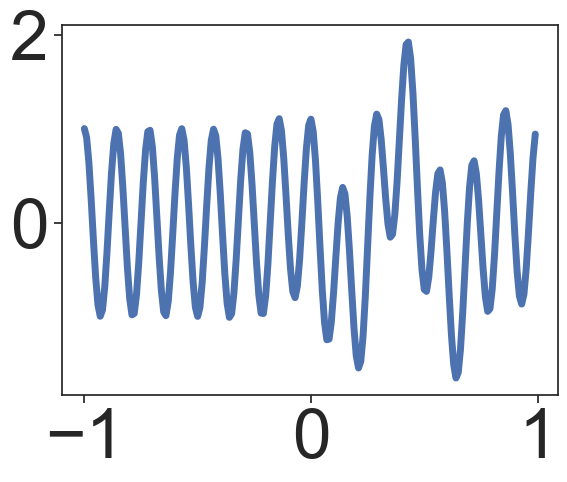

In [3]:
plt.close('all')
plt.plot(t,sig)

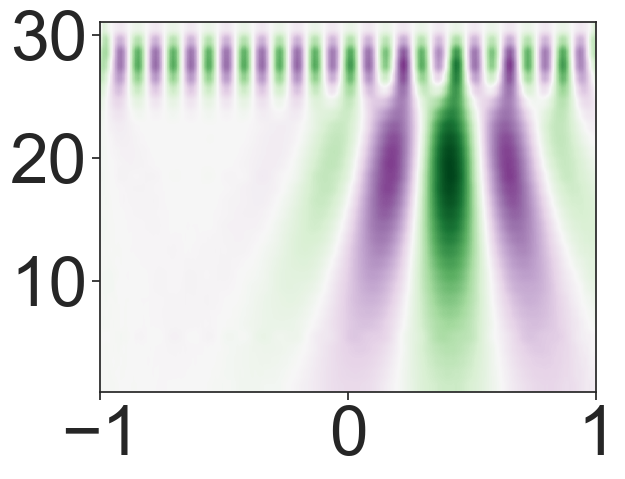

In [2]:
t = np.linspace(-1, 1, 200, endpoint=False)
sig  = np.cos(2 * np.pi * 7 * t) + np.real(np.exp(-7*(t-0.4)**2)*np.exp(1j*2*np.pi*2*(t-0.4)))
widths = np.arange(1, 31)
cwtmatr, freqs = pywt.cwt(sig, widths, 'mexh')
plt.imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())  
plt.show() 

In [3]:
def plot_aligned_spikes(beh,recording,timestamps,epoch,var,ax,colors,keys):


    voltage = recording.continuous[0].get_samples(start_sample_index=chunksize*bb, end_sample_index=chunksize*(bb+1))

    
    timestamps = data[epoch].to_numpy().astype(float)/1000+data['GlobalStart'].iloc[0]
    var_values = data[var].to_numpy()
    uni_var_values = np.unique(var_values)
    spikes_sorted = [[] for x in range(len(uni_var_values))]

    for trial in range(len(data)): 
        ind = (Spikes_alinged>timestamps[trial]-0.5) & (Spikes_alinged<(timestamps[trial]+1))
        trial_spike=Spikes_alinged[ind]-timestamps[trial]
        index=np.where(var_values[trial]==uni_var_values)[0][0]
        spikes_sorted[index].append(trial_spike)

    total_trial=0
    for ii,vv in enumerate(uni_var_values):

        curr_spikes = spikes_sorted[ii]
        n_trial = len(curr_spikes)

        for tt in range(n_trial):
            if len(curr_spikes[tt])>0:
                ax.plot([curr_spikes[tt],curr_spikes[tt]],[tt+total_trial,tt+total_trial+0.8],'k-')

        color_ind = np.where(keys==vv)[0][0]
        ax.fill_between([0,1],[total_trial,total_trial],[total_trial+n_trial,total_trial+n_trial],
                                 alpha=0.4,color=colors[color_ind])            

        total_trial=total_trial+n_trial

    ax.plot([0,0],ax.get_ylim(),color=[0.5,0.5,0.5])
        
    ax.set_xlim(-0.5,1)
    ax.set_xticks([])

    return uni_var_values

In [4]:
def load_data(DATA_DIRECTORY):
    
    # load sorted spikes and behavior
        
    os.chdir(DATA_DIRECTORY)
    for filepath in glob.glob('*.beh.txt'):
        beh = pd.read_csv(filepath, sep=",")
        beh.reset_index(drop=True, inplace=True)
        
    beh['FirstStep']=beh['CompletedNum']==1
    beh['IsGoal']=beh['Goal']==beh['ChosenState']
    
    # load OE timestamps
    session = Session(DATA_DIRECTORY)
    recording = session.recordnodes[0].recordings[0]
    timestamps = recording.continuous[0].timestamps
    
    align_file = open(DATA_DIRECTORY / 'Record Node 113/experiment1/recording1/alignmentinfo_README.txt', "r")
    align_info = align_file.readlines()
    
    A = float(align_info[1][3:-1])
    B = float(align_info[0][3:-1])
    
    # aligned to behavior
    timestamps_aligned = timestamps*A+B

    return beh,recording,timestamps_aligned

Neuron 56


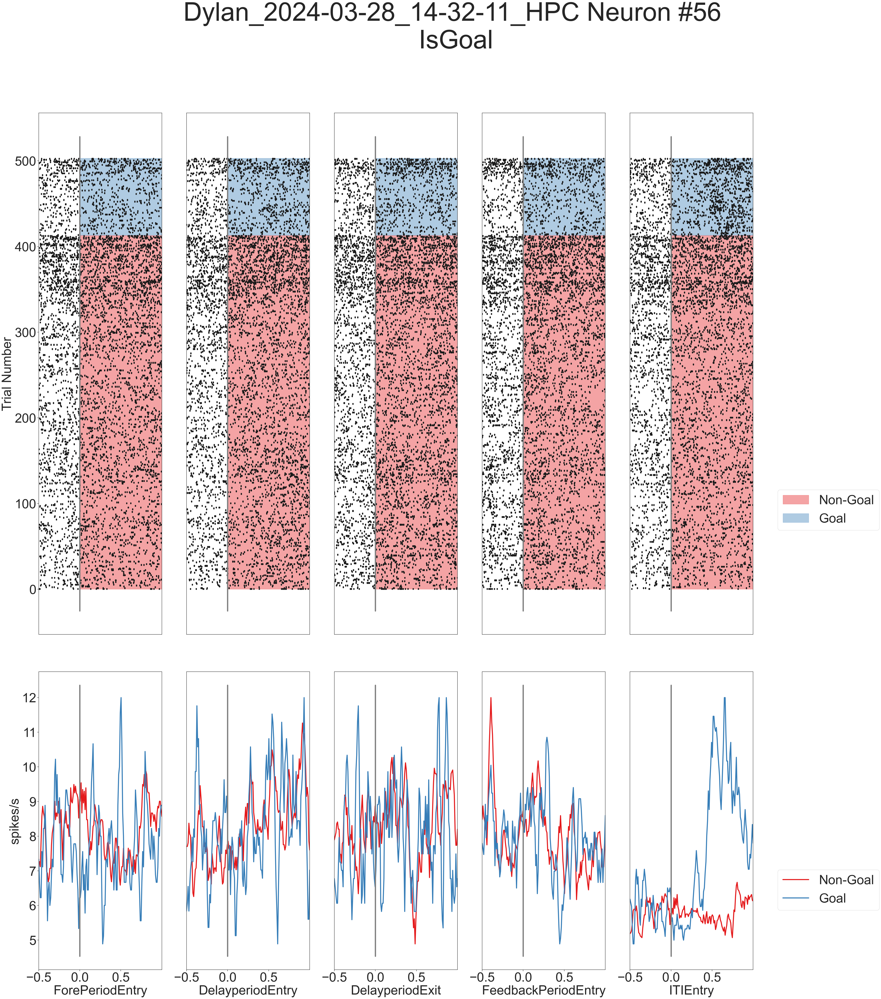

In [16]:
plot_session_neuron(DATA_DIRECTORY,clusters,spikes_ts,beh)

In [12]:
def plot_aligned_sdf(data,Spikes_alinged,epoch,var,ax,colors,keys,window=[-0.5,1],sliding=50,step=10):
    
    timestamps = data[epoch].to_numpy().astype(float)/1000+data['GlobalStart'].iloc[0]
    var_values = data[var].to_numpy()
    uni_var_values = np.unique(var_values)
    spikes_sorted = [[] for x in range(len(uni_var_values))]
    lgd_label = []
    
        
    for trial in range(len(data)): 
        ind = (Spikes_alinged>timestamps[trial]+window[0]-0.5) & (Spikes_alinged<(timestamps[trial]+window[1]+0.5))
        trial_spike=Spikes_alinged[ind]-timestamps[trial]
        binned_spikes,_ = np.histogram(trial_spike,np.linspace(window[0]-0.5,window[1]+0.5,int((window[1]-window[0])*1000+1001)))
        sdf = np.convolve(binned_spikes, np.ones(sliding)/sliding, mode='same')[500:-450:step]
        index=np.where(var_values[trial]==uni_var_values)[0][0]
        spikes_sorted[index].append(sdf)
        
    for ii,vv in enumerate(uni_var_values):

        if len(spikes_sorted[ii])>10:
                
            curr_spikes = np.array(spikes_sorted[ii]).mean(axis=0)*1000
            
            color_ind = np.where(keys==vv)[0][0]
            plt.plot(np.linspace(window[0],window[1],len(curr_spikes)),curr_spikes,color=colors[color_ind],lw=4)
            lgd_label.append(vv)
            
    ax.plot([0,0],ax.get_ylim(),color=[0.5,0.5,0.5])
    ax.set_xlim(-0.5,1)

    return lgd_label


In [15]:
def plot_session_neuron(DATA_DIRECTORY,clusters,spikes_ts,beh):
        
    for cellid in np.unique(clusters):
        if cellid==56:
            print('Neuron ' + str(cellid))
            
            cell_spikes = spikes_ts[clusters==cellid]
            
            for var in variables:
                
                y_max=0
                colors = sns.color_palette('Set1')
                    
                if var=='Goal' or var=='CurrentState' or var=='ChosenState':
                    colors = list(sns.color_palette('Purples',5))+list(sns.color_palette('Greens',5))+list(sns.color_palette('Reds',3))
                
                if var=='Distance':
                    colors = sns.color_palette('Purples_r',8)
            
                keys = np.array(list(variable_dict[variable_dict.col1==var].col2.values[0].keys()))
                    
                plt.close('all')
                fig=plt.figure(figsize=(60,60),facecolor=(1, 1, 1))
                gs = gridspec.GridSpec(8, 6,wspace=0.2,hspace=0.5) 
            
                for ii, epoch in enumerate(epochs):
                
                    ax = plt.subplot(gs[:5,ii])
                    lgd_val = plot_aligned_spikes(beh[(beh.Control==0) & (beh.Choice>-1)],cell_spikes,epoch,var,ax,colors,keys)
                    if ii==0:
                        ax.set_ylabel('Trial Number')
                    else:
                        ax.set_ylabel('')
                        ax.set_yticks([])
            
                    if ii==4:
                        for vv in lgd_val:
                            color_ind = np.where(keys==vv)[0][0]
                            ax.fill_between([0,0],[0,0],alpha=0.4,color=colors[color_ind],
                                            label=variable_dict[variable_dict.col1==var].col2.values[0].get(vv))
                        ax.legend(loc=(1.2,0.2))
            
            
                    ax = plt.subplot(gs[5:,ii])
                    lgd_val = plot_aligned_sdf(beh[(beh.Control==0) & (beh.Choice>-1)],cell_spikes,epoch,var,ax,colors,keys)
            
                    ax.set_xlim(-0.5,1)
                    ax.set_xticks([-0.5,0,0.5])
                    
                    y_max=np.max((ax.get_ylim()[1],y_max))
                    ax.set_xlabel(epoch)
                        
                    if ii==0:
                        ax.set_ylabel('spikes/s')
                    else:
                        ax.set_ylabel('')
                        ax.set_yticks([])
                        
                    if ii==4:
                        ncol=1
                        if len(beh[var].unique())>6:
                            ncol=2
                        ax.legend([variable_dict[variable_dict.col1==var].col2.values[0].get(key) for key in lgd_val],
                                  loc=(1.2,0.2),ncol=ncol)
            
                plt.suptitle(f + ' Neuron #'+str(cellid)+' \n'+var)
                
                plt.savefig(str(DATA_DIRECTORY) + '/Neuron'+str(cellid)+'_'+var+'.png', orientation = 'portrait', format = 'png')

KeyboardInterrupt: 

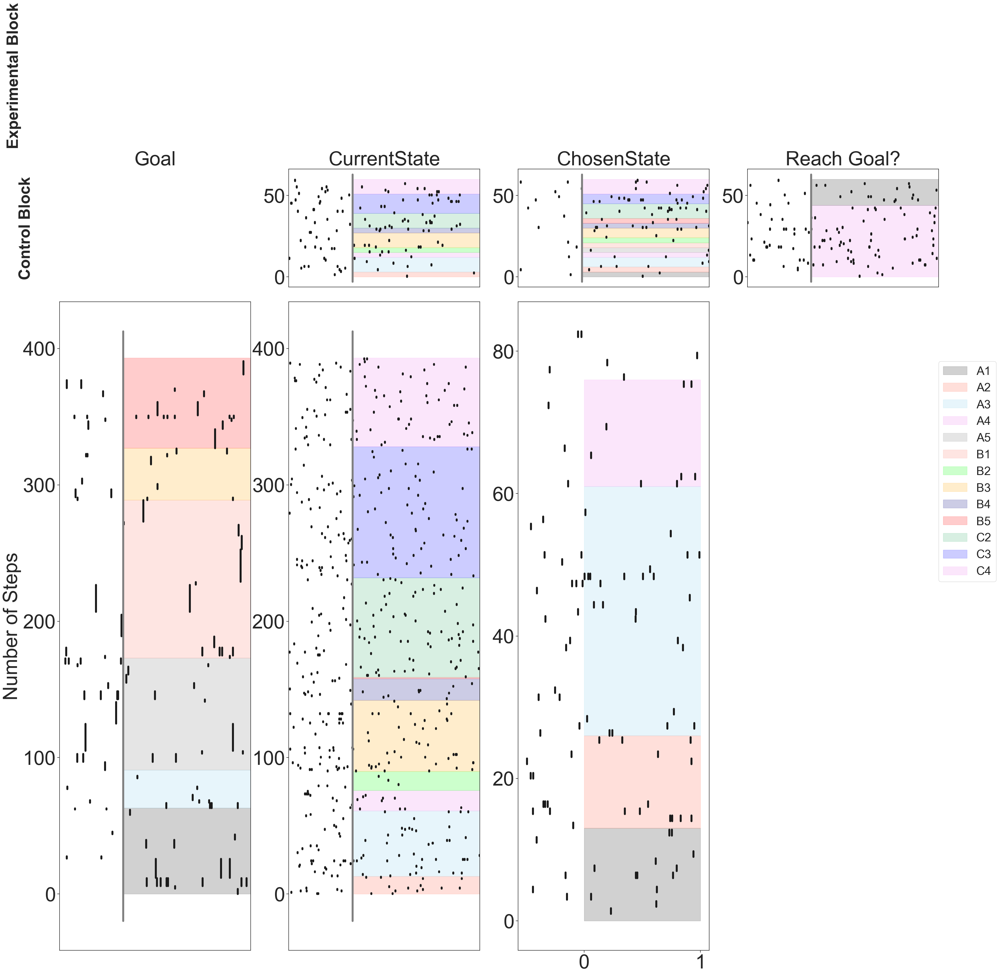

In [27]:
for cellid in np.unique(clusters):
    
    cell_spikes = spikes_ts[clusters==cellid]
    
    plt.close('all')
    fig=plt.figure(figsize=(40,54),facecolor=(1, 1, 1))
    gs = gridspec.GridSpec(27, 4,wspace=0.2,hspace=0.5) 
    
    # ax = plt.subplot(gs[:4,0])
    # sns.lineplot(data=beh[(beh.Distance<8) & (beh.Control==0) & (beh.Choice>-1)],hue='FirstStep',marker='o',markersize=20,
    #               lw=4,x='Distance',y='Choice')
    # ax.set_ylabel('Accuracy')
    # plt.title('Accuracy conditioned on distance\n')
    
    # ax = plt.subplot(gs[:4,1])
    # episode_length_df = calculate_length(beh[(beh.EpisodeNum==1)])
    # sns.pointplot(data=episode_length_df,x='optimal',y='actual',color='k',label='Data')
    # sns.pointplot(data=episode_length_df,x='optimal',y='optimal',color=[0.5,0.5,0.5],linestyles='--',label='Optimal')
    # ax.set_xlabel('Optimal walk length')
    # ax.set_ylabel('Averaged walk length')
    # ax.legend()
    # plt.title('Number of steps per walk\n')
    
    # ax = plt.subplot(gs[:4,2:])
    # conditioned_perf=beh[(beh.Control==0) & (beh.Choice>-1)].groupby(['Goal',
    #                    'CurrentState']).mean().reset_index()[['Goal','CurrentState','Choice']]
    # cmap = conditioned_perf.pivot(index='Goal', columns='CurrentState', values='Choice')
    # sns.heatmap(cmap,cmap='Purples',vmin=0.5,vmax=1,annot=True,annot_kws={'fontsize':30})
    # plt.xticks(np.linspace(0.5,11.5,12),['A2','A3','A4','A5','B1','B2','B3','B4','B5','C2','C3','C4'])
    # plt.yticks(np.linspace(0.5,5.5,6),['A1','A3','A5','B1','B3','B5'])
    # plt.title('Accuracy conditioned on current state and goal\n')
    
    ax = plt.subplot(gs[5:8,0])
    ax.plot([0,1],[0,1],lw=0)
    ax.set_title('Goal')
    ax.axis('off')
    plt.text(-0.2,0.5,'Control Block',rotation='vertical',fontsize=40,va='center',ha='right',weight='bold') 
    
    colors = ['k','tomato','skyblue','violet','gray','salmon','lime','orange','navy','red','mediumseagreen','blue','violet']
    labels = ['A1','A2','A3','A4','A5','B1','B2','B3','B4','B5','C2','C3','C4']
    for ii in range(13):
        ax.fill_between([0,0],[0,0],alpha=0.2,color=colors[ii],label=labels[ii])
    ax.legend(loc=[4.6,-2.5],fontsize=30)
    
    ax = plt.subplot(gs[5:8,1])
    plot_aligned_spikes(beh[beh.Control==1],cell_spikes,'ForePeriodEntry','CurrentState',ax)
    ax.set_title('CurrentState')
    
    ax = plt.subplot(gs[5:8,2])
    plot_aligned_spikes(beh[beh.Control==1],cell_spikes,'DelayperiodExit','ChosenState',ax)
    ax.set_title('ChosenState')
    
    ax = plt.subplot(gs[5:8,3])
    plot_aligned_spikes(beh[beh.Control==1],cell_spikes,'FeedbackPeriodEntry','IsGoal',ax)
    ax.set_title('Reach Goal?')
    
    ax = plt.subplot(gs[8:23,0])
    plot_aligned_spikes(beh[(beh.Control==0) & (beh.Choice>-1)],cell_spikes,'GoalPeriodStart','Goal',ax)
    ax.set_ylabel('Number of Steps')
    plt.text(-0.8,600,'Experimental Block',rotation='vertical',fontsize=40,va='center',ha='right',weight='bold')
    
    plot_aligned_spikes(beh[(beh.Control==0) & (beh.Choice>-1)],cell_spikes,
                        'ForePeriodEntry','CurrentState',plt.subplot(gs[8:23,1]))
    plot_aligned_spikes(beh[(beh.Control==0) & (beh.Choice>-1)],cell_spikes,
                        'DelayperiodExit','ChosenState',plt.subplot(gs[8:23,2]))
    plot_aligned_spikes(beh[(beh.Control==0) & (beh.Choice>-1)],cell_spikes,
                        'FeedbackPeriodEntry','IsGoal',plt.subplot(gs[8:23,3]))
    
    
    ax = plt.subplot(gs[23:,0])
    plot_aligned_sdf(beh[(beh.Control==0) & (beh.Choice>-1)],cell_spikes,'GoalPeriodStart','Goal',ax)
    ax.set_ylabel('Spikes/s')
    
    plot_aligned_sdf(beh[(beh.Control==0) & (beh.Choice>-1)],cell_spikes,'ForePeriodEntry','CurrentState',plt.subplot(gs[23:,1]))
    plot_aligned_sdf(beh[(beh.Control==0) & (beh.Choice>-1)],cell_spikes,
                     'DelayperiodExit','ChosenState',plt.subplot(gs[23:,2]))
    
    ax = plt.subplot(gs[23:,3])
    plot_aligned_sdf(beh[(beh.Control==0) & (beh.Choice>-1)],cell_spikes,
                     'FeedbackPeriodEntry','IsGoal',ax)
    colors = ['k','tomato','skyblue','violet','gray','salmon','lime','orange','navy','red','mediumseagreen','blue','violet']
    labels = ['A1','A2','A3','A4','A5','B1','B2','B3','B4','B5','C2','C3','C4']
    for ii in range(13):
        ax.plot([0,0],[0,0],color=colors[ii],label=labels[ii])
    ax.legend(loc=[1.02,0],fontsize=30)
    
    
    plt.suptitle(f+' Neuron #'+ str(cellid))

    plt.savefig(f+'_neuron'+str(cellid)+'control.png', orientation = 'portrait', format = 'png')

In [100]:
beh[['CurrentState','CorrectState','ChosenState']]

,CurrentState,CorrectState,ChosenState
0,12,13,13
1,13,8,8
2,8,7,7
3,7,6,6
4,12,13,13
...,...,...,...
255,12,11,11
256,11,3,3
257,3,2,11
258,11,3,12


In [15]:
# load LFP

samplesize = recording.continuous[0].samples.shape[0]
chunksize=30000*60  ## 1 minute
bins = int(np.floor(samplesize/chunksize))

# # for bb in range(bins):
bb=0
    
voltage = recording.continuous[0].get_samples(start_sample_index=chunksize*bb, end_sample_index=chunksize*(bb+1))
ts = recording.continuous[0].timestamps[chunksize*bb:chunksize*(bb+1)]
x=voltage[:,16]
sos = signal.butter(1, 300, btype='lowpass',output='sos',fs=30000)
filtered = signal.sosfilt(sos, x)
#     spikes, _ = find_peaks(filtered, height=75,distance=100)
#     Allspikes=np.append(Allspikes,ts[spikes]) # unit is second

In [28]:
for cellid in np.unique(clusters):
# for cellid in range(10,11):
    
    cell_spikes = spikes_ts[clusters==cellid]

    plt.close('all')
    fig=plt.figure(figsize=(70,120),facecolor=(1, 1, 1))
    gs = gridspec.GridSpec(7, 6,wspace=0.2,hspace=0.5) 
    
    epochs = ['ForePeriodEntry','DelayperiodEntry','DelayperiodExit','FeedbackPeriodEntry','ITIEntry']
    variables = ['Goal','CurrentState','ChosenState','Distance','ChosenLocation','Choice','IsGoal']
    
    for jj, var in enumerate(variables):
        
        y_max=0
        
        for ii, epoch in enumerate(epochs):
        
            ax = plt.subplot(gs[jj,ii])
            plot_aligned_sdf(beh[(beh.TotalEpisodeNum>16) & (beh.Choice>-1)],cell_spikes,epoch,var,ax)
    
            ax.set_xlim(-1,1)
            ax.set_xticks([-0.5,0,0.5])
            
            y_max=np.max((ax.get_ylim()[1],y_max))
            
            if jj==6:
                ax.set_xlabel(epoch)
            else:
                ax.set_xlabel('')
                
            if ii==0:
                ax.set_ylabel(var)
            else:
                ax.set_ylabel('')
                ax.set_yticks([])
                
            if ii==4:
                ncol=1
                if len(beh[var].unique())>6:
                    ncol=2
                ax.legend(np.unique(beh[(beh.TotalEpisodeNum>16) & (beh.Choice>-1)][var]).astype(str),loc=(1.2,0.2),ncol=ncol)

        for ii, epoch in enumerate(epochs):

            ax = plt.subplot(gs[jj,ii])
            ax.set_ylim(0,y_max)
            ax.plot([0,0],[0,y_max],color=[0.5,0.5,0.5])
            

            
    plt.suptitle(f + ' Neuron #'+str(cellid))

    plt.savefig(f + '_neuron'+str(cellid)+'_sdf.png', orientation = 'portrait', format = 'png')

In [152]:
for cellid in np.unique(clusters):
# for cellid in range(1):
    
    cell_spikes = spikes_ts[clusters==cellid]

    plt.close('all')
    fig=plt.figure(figsize=(70,120),facecolor=(1, 1, 1))
    gs = gridspec.GridSpec(8, 6,wspace=0.2,hspace=0.5) 
    
    epochs = ['ForePeriodEntry','DelayperiodEntry','DelayperiodExit','FeedbackPeriodEntry','ITIEntry']    
    var = 'Distance'
    y_max=0
    
    for dd in range(8): # distance
        
        for ii, epoch in enumerate(epochs):
        
            ax = plt.subplot(gs[dd,ii])
            plot_aligned_sdf(beh[(beh.TotalEpisodeNum>16) & (beh.Choice>-1) & (beh.Distance==dd+1)],cell_spikes,epoch,var,ax)
    
            ax.set_xlim(-1,1)
            ax.set_xticks([-0.5,0,0.5])
            
            y_max=np.max((ax.get_ylim()[1],y_max))
            
            if dd==7:
                ax.set_xlabel(epoch)
            else:
                ax.set_xlabel('')
                
            if ii==0:
                ax.set_ylabel(var)
            else:
                ax.set_ylabel('')
                ax.set_yticks([])
                
            if ii==4:
                ncol=1
                if len(beh[var].unique())>6:
                    ncol=2
                ax.legend(str(dd+1),loc=(1.2,0.2),ncol=ncol)

    for dd in range(8):
        for ii, epoch in enumerate(epochs):

            ax = plt.subplot(gs[dd,ii])
            ax.set_ylim(0,y_max)
            ax.plot([0,0],[0,y_max],color=[0.5,0.5,0.5])
            

            
    plt.suptitle('Dylan 2024226 Neuron #'+str(cellid))

    plt.savefig('Dylan_ses2024226_neuron'+str(cellid)+'_Distance_sdf.png', orientation = 'portrait', format = 'png')

In [12]:
spiketimes=[[] for trial in range(len(beh))]
sdf=np.zeros((len(beh),500))
gkernel = norm.pdf(np.linspace(norm.ppf(0.01),norm.ppf(0.99), 50))

for trial in range(len(beh)): 
    ref = beh['ForePeriodEntry'].iloc[trial]/1000+beh['GlobalStart'].iloc[0]
    ind = np.all((Spikes_alinged>ref-0.05,Spikes_alinged<(ref+0.55)),axis=0)
    trial_spike = Spikes_alinged[ind]-ref
    spiketimes[trial]=trial_spike
    binned_spike,_ = np.histogram(trial_spike,bins=np.arange(-0.05,0.550,0.001))
    sdf[trial,:] = signal.convolve(binned_spike, gkernel,mode='same')[50:-50]
    
neural=beh.copy()
neural['SpikeTimes']=spiketimes
neural = pd.concat([neural, pd.DataFrame(sdf)], axis=1)

In [13]:
binned_spike=binned_spike.melt(id_vars=beh.columns.values,var_name='Time', value_name='FR')

AttributeError: 'numpy.ndarray' object has no attribute 'melt'

Text(0.5, 0.98, 'SDF 50ms gaussian kernel')

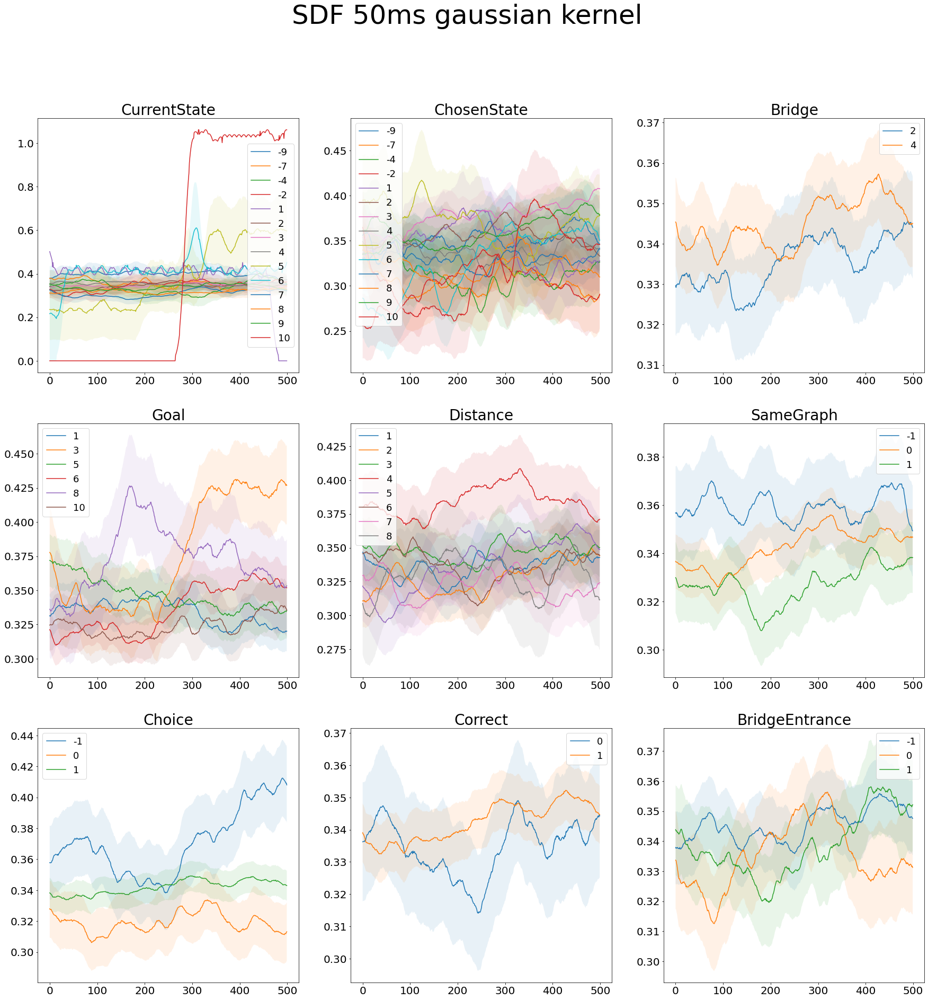

In [19]:
fig=plt.figure(figsize=(30,30),facecolor=(1, 1, 1))
gs = gridspec.GridSpec(3, 3,wspace=0.2,hspace=0.2) 
varOI = ['CurrentState','ChosenState','Bridge','Goal','Distance','SameGraph','Choice','Correct','BridgeEntrance']

for vv in range(9):
    
    ax = plt.subplot(gs[vv])

    variable=varOI[vv]
    conditioned_sdf_mean = neural.groupby([variable]).mean().iloc[:,-500::].values
    conditioned_sdf_sem = neural.groupby([variable]).sem().iloc[:,-500::].values
#     conditions=[str(x) for x in conditioned_sdf.index.values]
    conditions=neural.groupby([variable]).mean().index.values
    plt.plot(np.transpose(conditioned_sdf_mean))
    for ii in range(len(conditions)):
        plt.fill_between(np.arange(500),conditioned_sdf_mean[ii,:]-conditioned_sdf_sem[ii,:],
                         conditioned_sdf_mean[ii,:]+conditioned_sdf_sem[ii,:],alpha=0.1)
    plt.legend(conditions)
    plt.title(variable,fontsize=28)
    
s0=18
s1=20
s2=50
plt.rc('axes', labelsize=s1)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=s1)    # fontsize of the tick labels
plt.rc('ytick', labelsize=s1)    # fontsize of the tick labels
plt.rc('legend', fontsize=s0)    # legend fontsize
plt.rc('figure', titlesize=s2)  # fontsize of the figure title
plt.suptitle('SDF 50ms gaussian kernel')

In [87]:
## load raw data from openephys
session = Session('D:/HexinData/2024-02-26_14-01-21')
recording = session.recordnodes[0].recordings[1]
samplesize = recording.continuous[0].samples.shape[0]
chunksize=30000*60  ## 1 minute
bins = int(np.floor(samplesize/chunksize))

Allspikes=[]

for bb in range(bins):
    
    voltage = recording.continuous[0].get_samples(start_sample_index=chunksize*bb, end_sample_index=chunksize*(bb+1))
    ts = recording.continuous[0].timestamps[chunksize*bb:chunksize*(bb+1)]
    x=voltage[:,16]
    sos = signal.butter(10, 1000, btype='highpass',output='sos',fs=30000)
    filtered = signal.sosfilt(sos, x)
    spikes, _ = find_peaks(filtered, height=75,distance=100)
    Allspikes=np.append(Allspikes,ts[spikes]) # unit is second
    